# <h1><center>CodeIT AI Engineer 3기 Mission 8</center></h1>

## 문제

이번 미션에서는 U-Net을 이용해 축구 경기 영상 내의 다양한 객체(예: 골대, 심판, 선수, 관중 등)를 픽셀 단위로 분할하는 Semantic Segmentation 작업을 수행합니다. 실제 경기 장면에서 추출한 이미지를 바탕으로, 각 픽셀이 어떤 클래스에 속하는지 예측하는 모델을 직접 설계하고 학습해보세요.

### 데이터셋


데이터 링크: https://www.kaggle.com/datasets/sadhliroomyprime/football-semantic-segmentation

### 데이터 구성
- 본 데이터셋은 UEFA 슈퍼컵 2017 레알 마드리드 vs 맨체스터 유나이티드 경기 하이라이트 영상을 기반으로 수집된 축구 경기 장면들로 구성되어 있습니다. 총 100장의 프레임을 사용하였으며, 매 12번째 프레임을 추출해 흐릿한 장면이나 이상치는 일부 대체했습니다.

- 11개 클래스가 포함되어 있습니다.
	- Goal Bar (골대)
	- Referee (심판)
	- Advertisement (광고판)
	- Ground (잔디)
	- Ball (축구공)
	- Coaches & Officials (코칭 스태프 및 심판진)
	- Audience (관중)
	- Goalkeeper A (팀 A 골키퍼)
	- Goalkeeper B (팀 B 골키퍼)
	- Team A (팀 A 선수)
	- Team B (팀 B 선수)

## 데이터 로딩 및 시각화

In [1]:
import os
import json

from collections import defaultdict

import cv2
import numpy as np

import matplotlib.cm as cm
import matplotlib.pyplot as plt

from PIL import Image, ImageDraw

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import v2

from sklearn.model_selection import train_test_split

# GPU 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if device.type == 'cpu':
    # macOS에서 MPS 사용 가능 여부 확인
    device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(device)


mps


### Annotation JSON 기반 마스크 생성 결과 분석

In [2]:
# 경로 설정
json_path = "./data/COCO_Football Pixel.json"
image_root = "./data/images"  # 실제 이미지 위치

def annotation_test(image_idx):
	# JSON 로드
	with open(json_path, "r") as f:
		coco = json.load(f)

	# 매핑
	image_id_to_file = {img["id"]: img["file_name"] for img in coco["images"]}
	image_id_to_size = {img["id"]: (img["width"], img["height"]) for img in coco["images"]}
	cat_id_to_name = {cat["id"]: cat["name"] for cat in coco["categories"]}
	cat_id_to_color = {cat["id"]: cat["color"] for cat in coco["categories"]}


	cmap = cm.get_cmap('tab20', len(coco["categories"]))
	cat_id_to_color = {
		cat["id"]: [int(c[0]*255), int(c[1]*255), int(c[2]*255)]
		for cat, c in zip(coco["categories"], cmap.colors)
	}

	# 어노테이션 정리
	image_to_anns = defaultdict(list)
	for ann in coco["annotations"]:
		image_to_anns[ann["image_id"]].append(ann)

	# ✅ 시각화할 이미지 선택
	sample_image_id = coco["images"][image_idx]["id"]
	image_name = image_id_to_file[sample_image_id]
	width, height = image_id_to_size[sample_image_id]
	image_path = os.path.join(image_root, image_name)
	fuse_image_path = os.path.join(image_root, image_name + "___fuse.png")

	# 이미지 로드
	image = Image.open(image_path).convert("RGB")

	# 이미지 로드
	fuse_image = Image.open(fuse_image_path).convert("RGB")

	# 마스크(RGB 컬러)
	mask = Image.new("RGB", (width, height), (0, 0, 0))
	draw = ImageDraw.Draw(mask)

	# polygon → mask 색칠
	for ann in coco["annotations"]:
		if ann["image_id"] != sample_image_id:
			continue

		poly = ann["segmentation"][0]
		cat_id = ann["category_id"]
		polygon = [(poly[i], poly[i+1]) for i in range(0, len(poly), 2)]
		catname = cat_id_to_name[cat_id]
		color = cat_id_to_color[cat_id]
		print(cat_id, catname, color)
		draw.polygon(polygon, fill=(color[0], color[1], color[2]))

	# 시각화
	plt.figure(figsize=(14, 6))

	plt.subplot(1, 2, 1)
	plt.imshow(image)
	plt.title(f"Original Image {image_name}")
	plt.axis("off")

	plt.subplot(1, 2, 2)
	plt.imshow(mask)
	plt.title("Segmentation by Category Color")
	plt.axis("off")

	plt.tight_layout()
	plt.show()

	plt.imshow(fuse_image)
	plt.title(f"Fused Image")
	plt.axis("off")
	plt.show()


/var/folders/x_/3_f7q6q13z5btwymqrlxs_4m0000gn/T/ipykernel_22533/288826970.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(coco["categories"]))


1392794 Team A [158, 218, 229]
1392794 Team A [158, 218, 229]
1392794 Team A [158, 218, 229]
1392799 Team B [23, 190, 207]
1392799 Team B [23, 190, 207]
1392799 Team B [23, 190, 207]
1392801 Goalkeeper B [127, 127, 127]
1392802 Audience [227, 119, 194]
1392806 Advertisements [44, 160, 44]
1393250 Goal Bar [31, 119, 180]


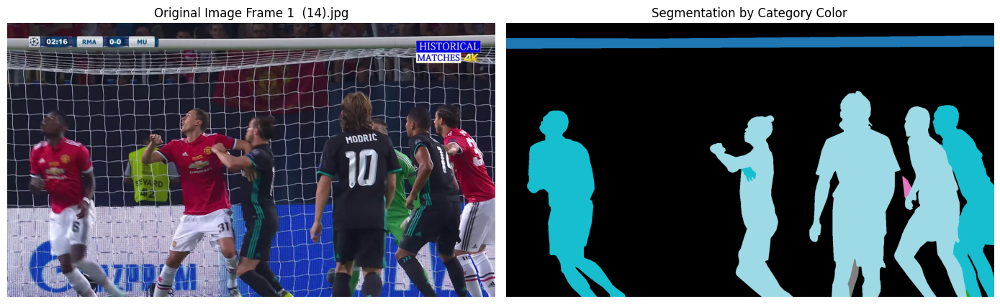

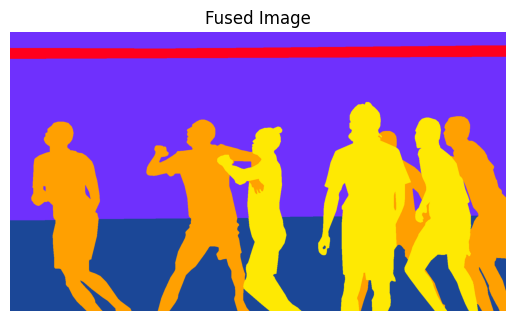

1392794 Team A [158, 218, 229]
1392794 Team A [158, 218, 229]
1392794 Team A [158, 218, 229]
1392799 Team B [23, 190, 207]
1392799 Team B [23, 190, 207]
1392800 Goalkeeper A [188, 189, 34]
1392802 Audience [227, 119, 194]
1392805 Ground [214, 39, 40]
1392806 Advertisements [44, 160, 44]


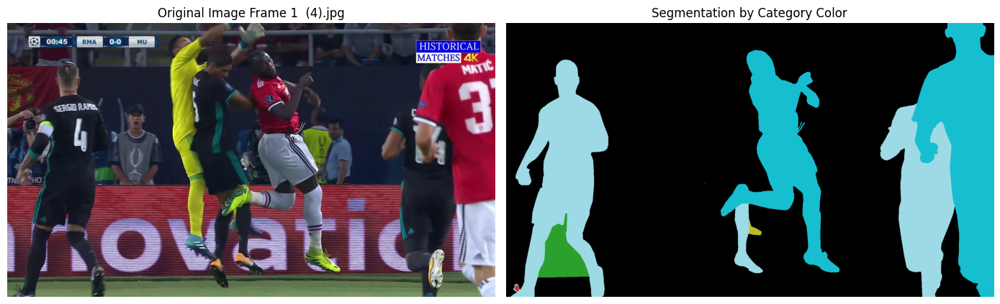

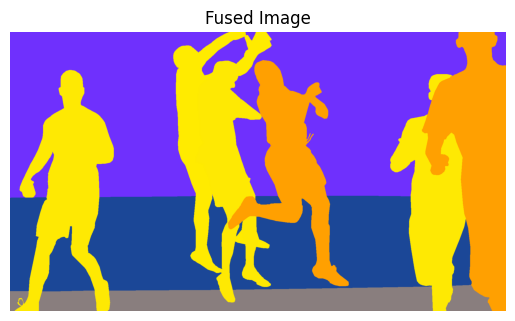

In [3]:
annotation_test(0)  # 첫 번째 이미지 테스트
annotation_test(10)  # 11번째 이미지 테스트

COCO_Football Pixel.json 파일을 활용하여 직접 segmentation mask를 생성해보았습니다. 이를 위해 polygon 형태의 segmentation 데이터를 바탕으로 카테고리별로 색을 할당하고, 각 객체를 픽셀 단위로 채워 넣는 방식으로 마스크를 구성하였습니다.

그러나 시각화를 통해 확인한 결과, 직접 생성한 마스크는 다음과 같은 한계점을 가지고 있음을 알 수 있었습니다:
- 복잡한 객체의 경계가 부정확하게 처리됨: polygon 포맷이 충분히 정밀하지 않거나, segmentation 포인트의 개수가 부족하여 세밀한 형태 표현에 어려움이 있음
- 다중 객체 겹침 처리 미비: 일부 프레임에서는 객체 간 레이어링 정보가 없어, 후순위 객체가 마스크에서 누락되는 문제가 발생함
- 실제 제공된 마스크(fuse/save 이미지)와 비교해 디테일 손실이 큼


### 결론

위 결과를 바탕으로, 제공된 segmentation 마스크 이미지(___fuse.png, ___save.png)를 학습에 활용하기로 결정하였습니다.

## Dataset 클래스 재정의 (fuse 마스크 사용)

Semantic Segmentation 모델 학습을 위해, 각 입력 이미지에 대해 해당하는 픽셀 단위 정답(label) 마스크가 필요합니다.

초기에는 COCO JSON 기반 polygon을 사용하여 마스크를 직접 생성하려 했지만, 

제공된 ___fuse.png 파일이 훨씬 더 고품질의 라벨을 포함하고 있어 모델 성능을 극대화하기 위해 이를 학습에 활용하기로 결정하였습니다.

In [4]:
class FootballSegmentationDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.image_list = sorted([
            f for f in os.listdir(image_dir)
            if f.endswith(".jpg") and "___" not in f  # 원본 이미지만 대상
        ])
        
        seg_files = sorted([
			f for f in os.listdir(image_dir)
			if f.endswith("___fuse.png")  # 마스크 파일만 대상
		])
        
        def get_unique_colors(seg_files, max_classes=11):
            color_set = set()
            
            for seg_file in seg_files:
                seg_path = os.path.join(self.image_dir, seg_file)
                seg = cv2.imread(seg_path, cv2.IMREAD_COLOR)
                if seg is None:  # Check if image loading was successful
                    print(f"Warning: Could not read image file: {seg_path}")
                    continue  # Skip this file and continue with the next
                seg = cv2.cvtColor(seg, cv2.COLOR_BGR2RGB)
                unique_colors = np.unique(seg.reshape(-1,3), axis=0)
				
                for color in unique_colors:
                    color_set.add(tuple(color))
                    if len(color_set) >= max_classes:
                        return list(color_set)
            return list(color_set)

        unique_colors = get_unique_colors(seg_files)
        self.color_to_label = {color: idx for idx, color in enumerate(unique_colors)}
        self.transform = transform

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, idx):
        image_name = self.image_list[idx]
        image_path = os.path.join(self.image_dir, image_name)

        # Corresponding mask: Frame 1 (1).jpg → Frame 1 (1).jpg___fuse.png
        mask_name = image_name + "___fuse.png"
        mask_path = os.path.join(self.image_dir, mask_name)
        
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)

        mask_class = np.zeros(mask.shape[:2], dtype=np.uint8)
        for color, label in self.color_to_label.items():
            mask_class[(mask == color).all(axis=-1)] = label

        if self.transform:
            image = self.transform(image)
            mask_class = self.transform(mask_class).squeeze(0).long()

        return image, mask_class

In [5]:
input_transform = v2.Compose([
    v2.ToImage(),
    v2.Resize((256, 256)),
    v2.ToDtype(torch.float32),
])

In [6]:
dataset = FootballSegmentationDataset(
    image_dir="./data/images",
    transform=input_transform,
)

img, mask = dataset[0]
print(img.shape)   # torch.Size([3, 256, 256])
print(mask.shape)  # torch.Size([256, 256])

torch.Size([3, 256, 256])
torch.Size([256, 256])


## U-Net 모델 정의

축구 장면 속 11개 클래스를 분류해야 하므로, 출력 채널 수는 11개로 설정

In [7]:
class UNet(nn.Module):
    def __init__(self, num_classes):
        super().__init__()

        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_channels),
                nn.ReLU(inplace=True),
            )

        self.enc1 = conv_block(3, 64)
        self.enc2 = conv_block(64, 128)
        self.enc3 = conv_block(128, 256)

        self.pool = nn.MaxPool2d(2, 2)

        self.bottleneck = conv_block(256, 512)

        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = conv_block(512, 256)

        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = conv_block(256, 128)

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = conv_block(128, 64)

        self.classifier = nn.Conv2d(64, num_classes, 1)

    def forward(self, x):
        # Encoder
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))

        # Bottleneck
        b = self.bottleneck(self.pool(e3))

        # Decoder with skip connections
        d3 = self.up3(b)
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)

        d2 = self.up2(d3)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)

        d1 = self.up1(d2)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)

        # Output: (B, num_classes, H, W)
        out = self.classifier(d1)
        return out

In [8]:
model = UNet(num_classes=11).to(device)
print(sum(p.numel() for p in model.parameters() if p.requires_grad))  # 총 파라미터 수

7703627


## 학습 및 검증 루프

In [9]:
def train_one_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    total_loss = 0

    for images, masks in dataloader:
        images = images.to(device)
        masks = masks.to(device)
        masks = torch.clamp(masks, min=0, max=10)

        optimizer.zero_grad()
        outputs = model(images)  # (B, C, H, W)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(dataloader)


def validate(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0

    with torch.no_grad():
        for images, masks in dataloader:
            images = images.to(device)
            masks = masks.to(device)

            outputs = model(images)
            loss = criterion(outputs, masks)
            total_loss += loss.item()

    return total_loss / len(dataloader)
	

In [10]:
train_dataset, val_dataset = train_test_split(dataset, test_size=0.2, random_state=42, shuffle=True)

# 데이터셋 준비
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

print(f"Train dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")

Train dataset size: 80
Validation dataset size: 20


### 학습 및 검증 루프를 구현하여 모델을 학습시키고, 각 에폭(epoch)마다 손실(loss)을 기록합니다.

In [11]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)

loss_history = {
	"train": [],
	"val": []
}

# 학습 및 검증 루프
num_epochs = 60
for epoch in range(num_epochs):
    train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
    val_loss = validate(model, val_loader, criterion, device)
    
    loss_history["train"].append(train_loss)
    loss_history["val"].append(val_loss)

    print(f"[Epoch {epoch+1}] Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}")

[Epoch 1] Train Loss: 1.3982 | Val Loss: 1.1679
[Epoch 2] Train Loss: 1.0045 | Val Loss: 0.8497
[Epoch 3] Train Loss: 0.7694 | Val Loss: 0.8157
[Epoch 4] Train Loss: 0.6628 | Val Loss: 0.7356
[Epoch 5] Train Loss: 0.6556 | Val Loss: 0.6758
[Epoch 6] Train Loss: 0.5519 | Val Loss: 0.5887
[Epoch 7] Train Loss: 0.4759 | Val Loss: 0.5507
[Epoch 8] Train Loss: 0.4972 | Val Loss: 0.7030
[Epoch 9] Train Loss: 0.4598 | Val Loss: 0.5872
[Epoch 10] Train Loss: 0.4214 | Val Loss: 0.4454
[Epoch 11] Train Loss: 0.4671 | Val Loss: 0.5233
[Epoch 12] Train Loss: 0.3745 | Val Loss: 0.4456
[Epoch 13] Train Loss: 0.3538 | Val Loss: 0.3506
[Epoch 14] Train Loss: 0.3386 | Val Loss: 0.3479
[Epoch 15] Train Loss: 0.3250 | Val Loss: 0.3366
[Epoch 16] Train Loss: 0.2962 | Val Loss: 0.2965
[Epoch 17] Train Loss: 0.2912 | Val Loss: 0.3055
[Epoch 18] Train Loss: 0.2819 | Val Loss: 0.3071
[Epoch 19] Train Loss: 0.2699 | Val Loss: 0.3235
[Epoch 20] Train Loss: 0.2694 | Val Loss: 0.3072
[Epoch 21] Train Loss: 0.2641

### 기록한 손실을 바탕으로 학습 곡선을 시각화하여 모델의 학습 진행 상황을 모니터링합니다.

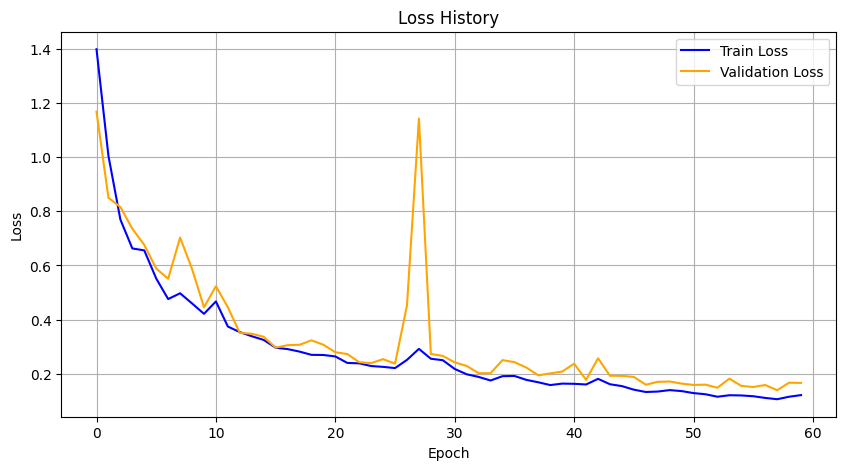

In [12]:
# loss_history 시각화

plt.figure(figsize=(10, 5))
plt.plot(loss_history["train"], label="Train Loss", color="blue")
plt.plot(loss_history["val"], label="Validation Loss", color="orange")
plt.title("Loss History")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid()
plt.show()

## 예측 결과 시각화

원본 이미지, 실제 마스크(Ground Truth), 예측 마스크(Prediction)를 나란히 비교해서 성능 직관적으로 평가

In [13]:
def visualize_prediction(model, dataset, index, device):
    model.eval()

    image, true_mask = dataset[index]
    image = image.unsqueeze(0).to(device)  # (1, 3, H, W)

    with torch.no_grad():
        output = model(image)  # (1, 11, H, W)
        pred_mask = torch.argmax(output, dim=1).squeeze(0).cpu()  # (H, W)

    image_np = dataset[index][0].permute(1, 2, 0).cpu().numpy()
    image_np = image_np / 255.0  # Normalize to [0, 1]
    image_np = np.clip(image_np, 0, 1)  # Ensure values are in [0, 1]
    
    true_mask_np = true_mask.numpy()

    # 시각화
    plt.figure(figsize=(16, 5))
    plt.subplot(1, 3, 1)
    plt.imshow(image_np)
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(true_mask_np, cmap='jet')
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask.numpy(), cmap='jet')
    plt.title("Prediction")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

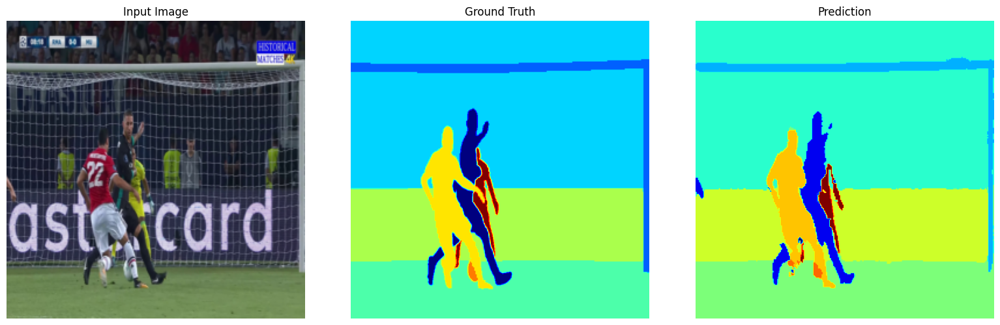

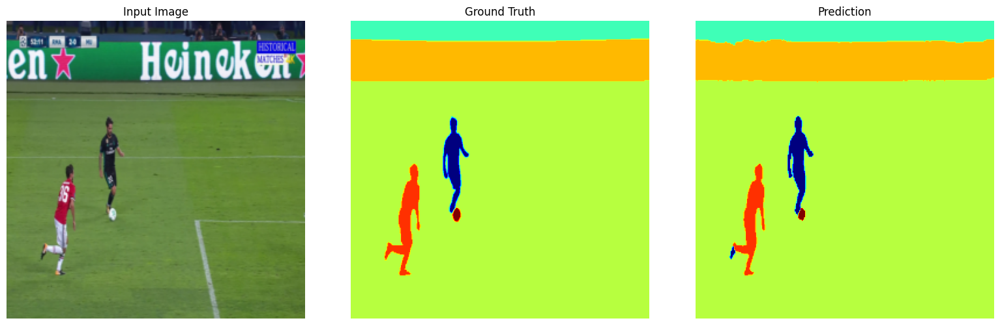

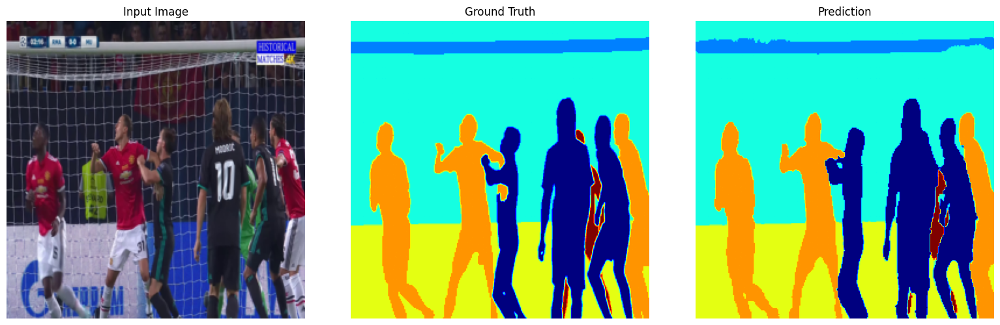

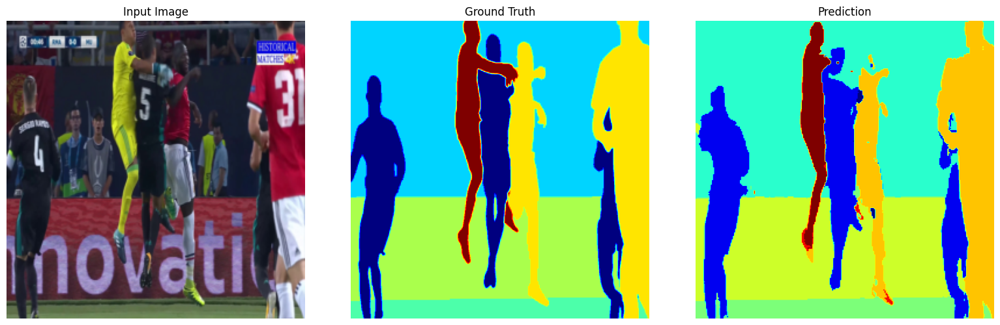

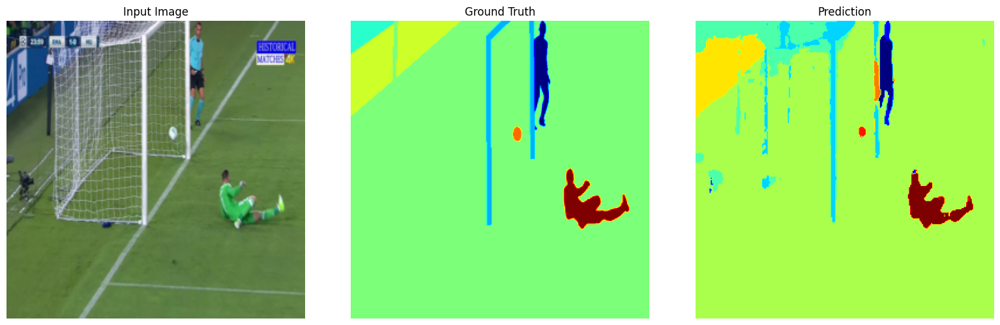

...

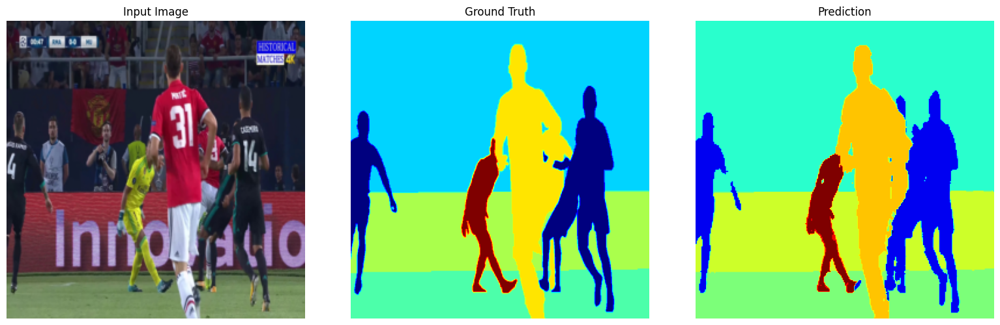

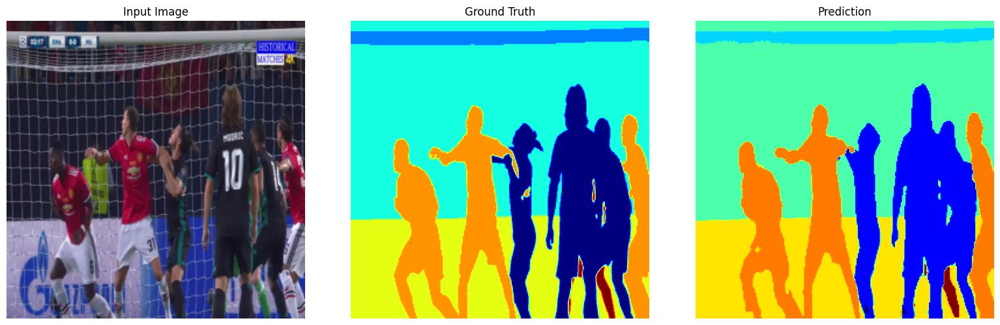

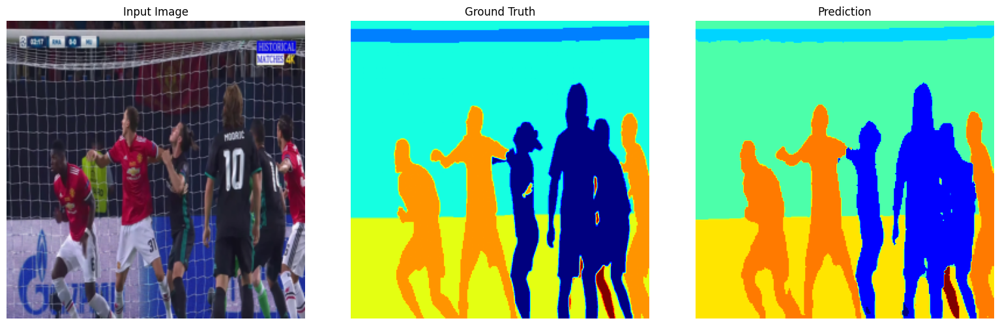

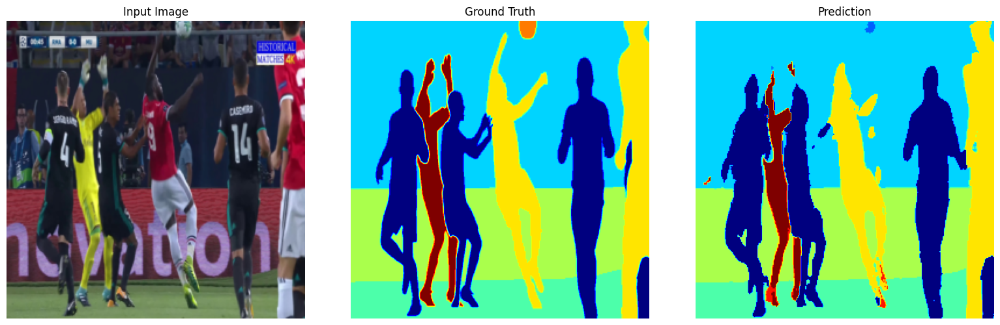

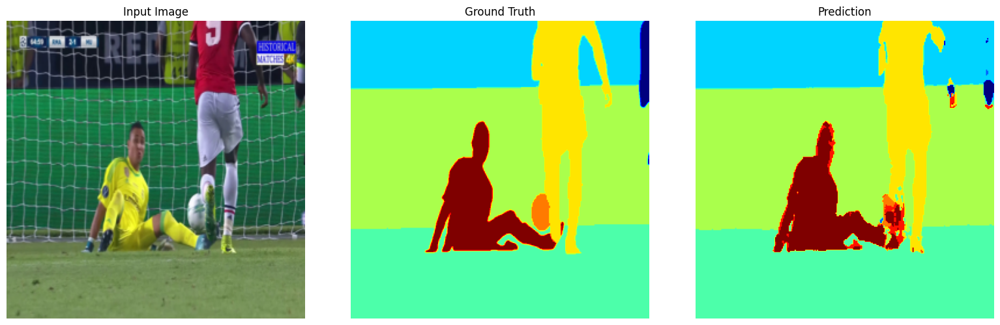

In [14]:
# 예: 검증 데이터셋의 이미지 시각화
for i in range(0, 20):
    visualize_prediction(model, val_dataset, index=i, device=device)

### 시각적 결과 분석

- 모델이 골대, 심판, 선수 등 주요 객체를 잘 분할하고 있으나, 관중과 광고판의 경우 일부 오분류가 발생
- 주요 객체인 선수(Team A, Team B)와 Goalkeeper, Ball 등은 대체로 정확히 담지되었으나, 겹치는 인물이 낮은 객체에서는 혼동이 발생했습니다.
- Ground Truth와 Prediction 간의 유사도가 높아, 모델이 실제 객체의 위치와 형태를 잘 학습했음을 시각적으로 확인할 수 있었습니다.

### 모델 성능 개선을 위한 시사점
- 객체 간 겹침이나 작은 객체 인식 정확도를 향상시키기 위해, Attention U-Net 또는 U-Net++ 등의 구조를 향후 적용해볼 수 있습니다.
- 또한, Ball이나 심판과 같은 클래스는 상대적으로 학습 데이터가 적을 수 있으므로 클래스 불균형 보정이나 FocalLoss 등의적용도 고려할 수 있습니다.
